In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/early-detection-of-3d-printing-issues/sample_submission.csv
/kaggle/input/early-detection-of-3d-printing-issues/train.csv
/kaggle/input/early-detection-of-3d-printing-issues/test.csv
/kaggle/input/early-detection-of-3d-printing-issues/images/101/1678580155/1678580500.083077.jpg
/kaggle/input/early-detection-of-3d-printing-issues/images/101/1678580155/1678580752.783998.jpg
/kaggle/input/early-detection-of-3d-printing-issues/images/101/1678580155/1678580539.758166.jpg
/kaggle/input/early-detection-of-3d-printing-issues/images/101/1678580155/1678580391.966936.jpg
/kaggle/input/early-detection-of-3d-printing-issues/images/101/1678580155/1678580591.293364.jpg
/kaggle/input/early-detection-of-3d-printing-issues/images/101/1678580155/1678580419.931404.jpg
/kaggle/input/early-detection-of-3d-printing-issues/images/101/1678580155/1678580604.825959.jpg
/kaggle/input/early-detection-of-3d-printing-issues/images/101/1678580155/1678580437.550019.jpg
/kaggle/input/early-detection-of-3d

In [2]:
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import random as rn

from keras.callbacks import History
history = History()

#preprocess.
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

(1080, 1920, 3)


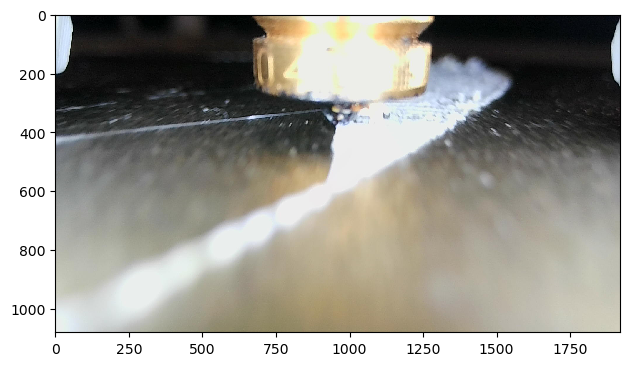

In [3]:
from numpy import asarray
from skimage.io import imread, imshow

from PIL import Image

img = '/kaggle/input/early-detection-of-3d-printing-issues/images/103/1679008414/1679008522.082014.jpg'
# Using 0 to read image in grayscale mode
imshow(img)
img = imread(img)
print(img.shape)

(780, 1320, 3)


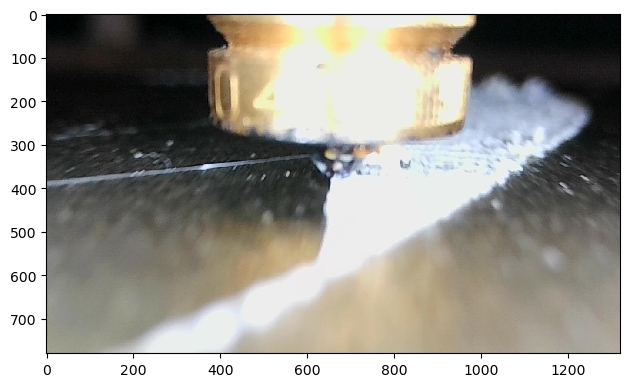

In [4]:
from skimage import io, util
image = io.imread('/kaggle/input/early-detection-of-3d-printing-issues/images/103/1679008414/1679008522.082014.jpg')

# Set the amount of cropping to apply to the right, left, and bottom sides of the image
crop_size = 300

# Calculate the coordinates of the cropping area based on the image size and crop size
x = crop_size
y = 0
w = image.shape[1] - crop_size * 2
h = image.shape[0] - crop_size

# Crop the image using the crop function
cropped_image = util.crop(image, ((y, image.shape[0]-y-h), (x, image.shape[1]-x-w), (0, 0)))

# Display the cropped image
io.imshow(cropped_image)
print(cropped_image.shape)

(480, 640, 3)


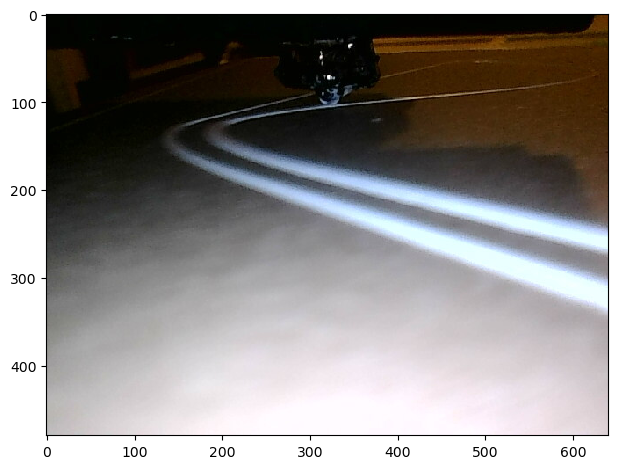

In [5]:
img = '/kaggle/input/early-detection-of-3d-printing-issues/images/101/1678337873/1678338069.210787.jpg'
# Using 0 to read image in grayscale mode
imshow(img)
img = imread(img)
print(img.shape)

(230, 140, 3)


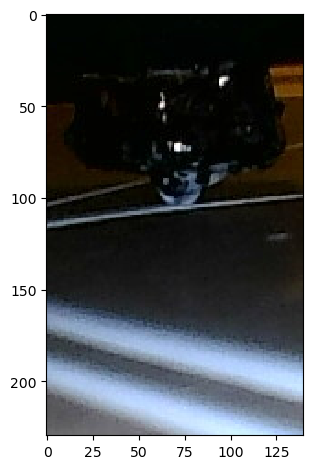

In [6]:
image = io.imread('/kaggle/input/early-detection-of-3d-printing-issues/images/101/1678337873/1678338069.210787.jpg')

# Set the amount of cropping to apply to the right, left, and bottom sides of the image
crop_size = 250

# Calculate the coordinates of the cropping area based on the image size and crop size
x = crop_size
y = 0
w = image.shape[1] - crop_size * 2
h = image.shape[0] - crop_size

# Crop the image using the crop function
cropped_image = util.crop(image, ((y, image.shape[0]-y-h), (x, image.shape[1]-x-w), (0, 0)))

# Display the cropped image
io.imshow(cropped_image)
print(cropped_image.shape)

(480, 640, 3)


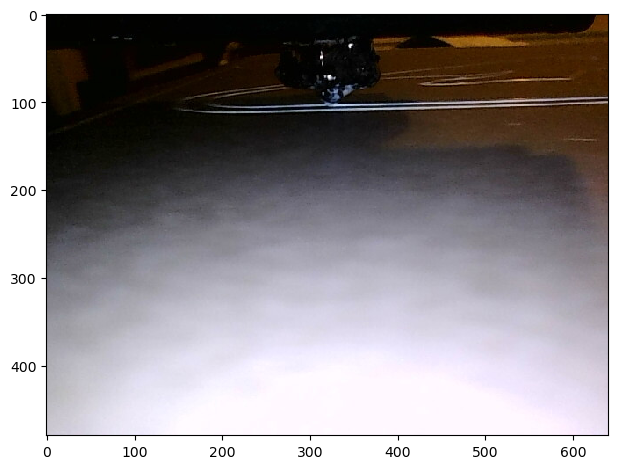

In [7]:
img = '/kaggle/input/early-detection-of-3d-printing-issues/images/101/1678333984/1678334174.557014.jpg'
imshow(img)
img = imread(img)
print(img.shape)

(230, 140, 3)


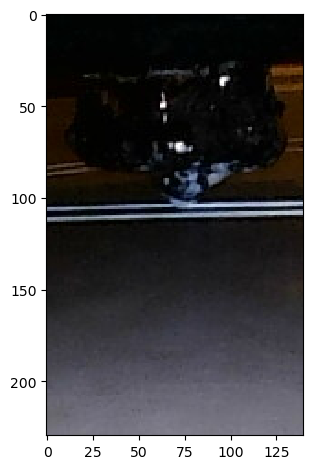

In [8]:
image = io.imread('/kaggle/input/early-detection-of-3d-printing-issues/images/101/1678333984/1678334174.557014.jpg')

# Set the amount of cropping to apply to the right, left, and bottom sides of the image
crop_size = 250

# Calculate the coordinates of the cropping area based on the image size and crop size
x = crop_size
y = 0
w = image.shape[1] - crop_size * 2
h = image.shape[0] - crop_size

# Crop the image using the crop function
cropped_image = util.crop(image, ((y, image.shape[0]-y-h), (x, image.shape[1]-x-w), (0,0)))

# Display the cropped image
io.imshow(cropped_image)
print(cropped_image.shape)

In [9]:
main_dir = '../input/early-detection-of-3d-printing-issues/'
train_df = pd.read_csv("../input/early-detection-of-3d-printing-issues/train.csv")
test_df = pd.read_csv("../input/early-detection-of-3d-printing-issues/test.csv")
img_dir = os.path.join(main_dir, 'images/')

In [10]:
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam

from keras.layers import Dropout, Flatten,Activation, Resizing
from keras.layers import Conv2D, MaxPooling2D

In [11]:
train_df['has_under_extrusion'] = train_df['has_under_extrusion'].astype(str)

In [12]:
# pip install --upgrade Pillow

In [13]:
# crop_size = 250
# x = crop_size
# y = 0
img_width, img_height = 320, 320
def myFunc(img, target_size):  
    w, h = img.shape[0], img.shape[1]
    dy,dx = target_size
#     print(w,h, dx, dy)
    start_y = (h - dy) // 2
    start_x = (w - dx) // 2
    return img[start_y:start_y+dy, start_x:(dx+start_x), :]
#     # Calculate the coordinates of the cropping area based on the image size and crop size    
# #     print(image.shape)
#     return cv2.resize(np.array(image.resize((img_width+32, img_height+32), resample=0).crop((16, 16, img_width+16, img_height+16))),target_size)
datagen = ImageDataGenerator(rescale=1./255,
                            preprocessing_function=lambda x : myFunc(x, (320,320)),
                            horizontal_flip=True, # apply horizontal flipping
                            vertical_flip=True, # apply vertical flipping  
                            zoom_range = 0.2,
                            width_shift_range = 0.2,
                            height_shift_range = 0.2,
                            shear_range = 0.2,
                            validation_split = 0.2)

In [14]:
# crop_size = 0
# x = crop_size
# y = 0
# import cv2
# def myFunc(image, target_size):    
#     # Calculate the coordinates of the cropping area based on the image size and crop size    
# #     print(image.shape)
#     image = cv2.resize(image, (640, 480))
#     w = image.shape[1] - crop_size * 2
#     h = image.shape[0] - crop_size
    
#     # Crop the image using the crop function
#     cropped_image = util.crop(image, ((y, image.shape[0]-y-h), (x, image.shape[1]-x-w), (0, 0)))
#     resized_img = cv2.resize(cropped_image, target_size)
#     hsv_img = cv2.cvtColor(resized_img, cv2.COLOR_RGB2HSV)
    
#     rescaled_img = hsv_img.astype('float32')/255.0
#     return rescaled_img
    
# datagen_test = ImageDataGenerator(width_shift_range = 0.2,
#                             height_shift_range = 0.2,
#                             shear_range = 0.2,
#                             zoom_range = 0.2,
#                             horizontal_flip = True,
#                             fill_mode = 'nearest',
#                             brightness_range = [0.5,1.5],
#                             preprocessing_function =lambda x: myFunc(x, (320, 320)),
#                             validation_split = 0.2)

In [15]:
train_datagen = datagen.flow_from_dataframe(
                            dataframe = train_df,
                            directory = img_dir,
                            x_col = 'img_path',
                            y_col = 'has_under_extrusion',
                            target_size = (320, 320),
                            batch_size = 32,
                            has_ext=True,
                            class_mode = 'binary',
                            subset = 'training'
)

Found 64848 validated image filenames belonging to 2 classes.


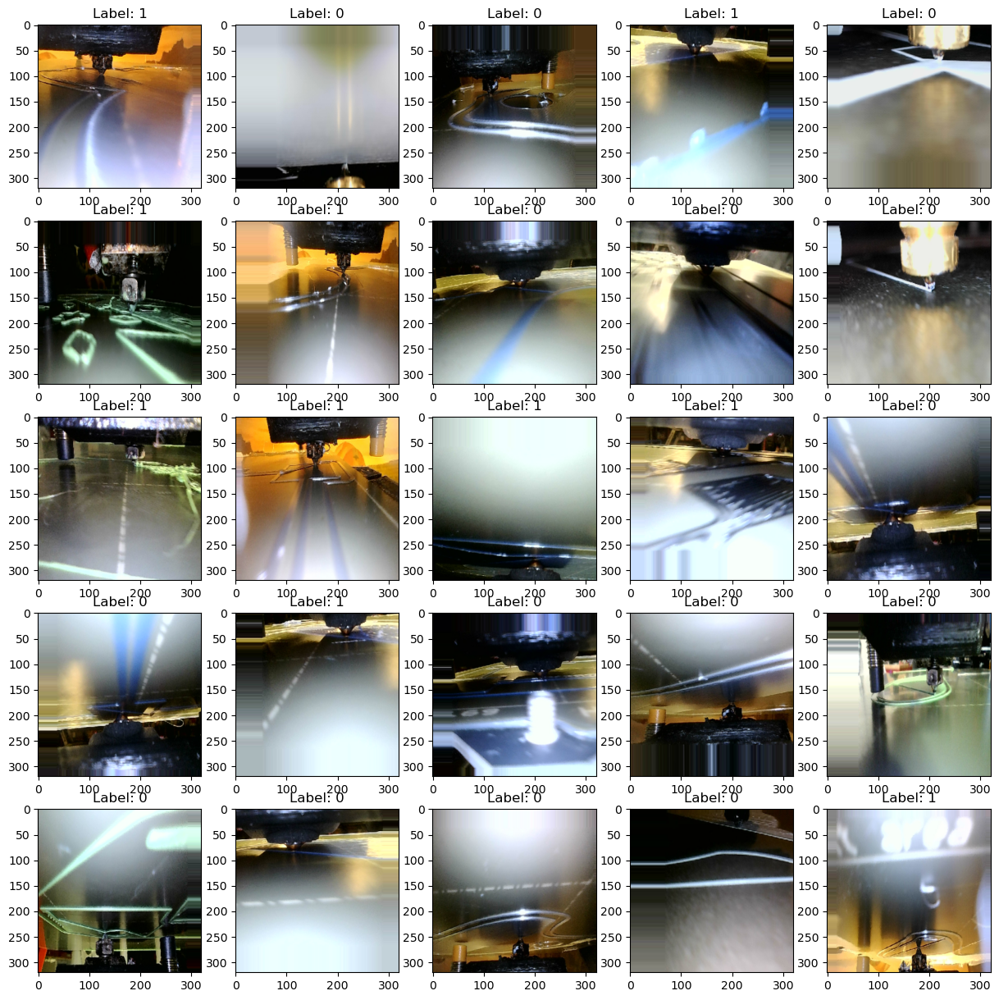

In [16]:
fig, ax = plt.subplots(nrows=5, ncols=5, figsize=(15,15))
batch = train_datagen.next()
k=0
for i in range(5):
    for j in range(5):
        image = batch[0][k]
        label = batch[1][k]
        ax[i,j].imshow(image)
        ax[i,j].set_title('Label: ' + str(int(label)))
        k+=1

In [17]:
validation_datagen = datagen.flow_from_dataframe(
                            dataframe = train_df,
                            directory = img_dir,
                            x_col = 'img_path',
                            y_col = 'has_under_extrusion',
                            target_size = (320, 320),
                            batch_size = 32,
                            class_mode = 'binary',
                            subset = 'validation')

Found 16212 validated image filenames belonging to 2 classes.


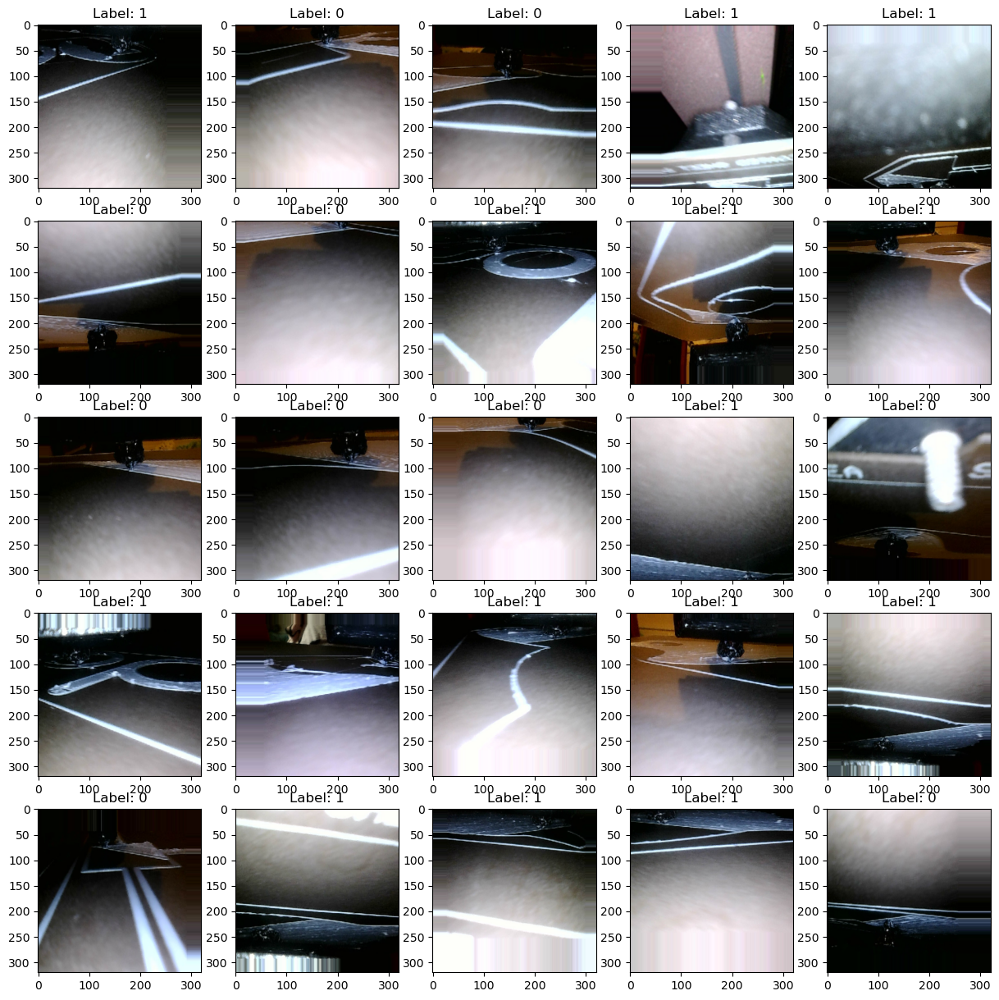

In [18]:
fig, ax = plt.subplots(nrows=5, ncols=5, figsize=(15,15))
batch = validation_datagen.next()
k=0
for i in range(5):
    for j in range(5):
        image = batch[0][k]
        label = batch[1][k]
        ax[i,j].imshow(image)
        ax[i,j].set_title('Label: ' + str(int(label)))
        k+=1

In [19]:
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(320, 320, 3)))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(256, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(512, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [20]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [21]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=2)
from tensorflow.keras.callbacks import ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=1, verbose=1)

In [22]:
hist = model.fit(
    train_datagen,
    steps_per_epoch=train_datagen.samples // train_datagen.batch_size,
    epochs=7,
    validation_data=validation_datagen,
    validation_steps=validation_datagen.samples // validation_datagen.batch_size,
    callbacks= [callback]
) 

Epoch 1/7
2026/2026 [==============================] - 3138s 2s/step - loss: 0.3566 - accuracy: 0.8146 - val_loss: 1.1722 - val_accuracy: 0.5060
Epoch 2/7
2026/2026 [==============================] - 2721s 1s/step - loss: 0.1190 - accuracy: 0.9531 - val_loss: 1.3314 - val_accuracy: 0.5897
Epoch 3/7
2026/2026 [==============================] - 2806s 1s/step - loss: 0.0690 - accuracy: 0.9748 - val_loss: 2.2767 - val_accuracy: 0.5440


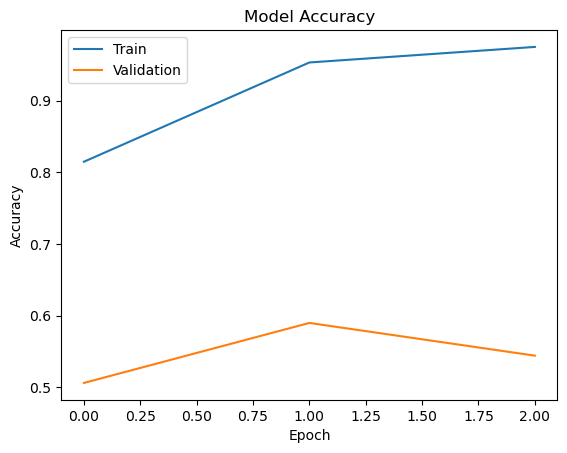

In [23]:
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [24]:
datagen1 = ImageDataGenerator(rescale=1./255,
                            preprocessing_function=lambda x : myFunc(x, (320,320)))
    
test_datagen = datagen1.flow_from_dataframe(
                            dataframe = test_df,
                            directory = img_dir,
                            x_col = 'img_path',
                            target_size = (320,320),
                            batch_size = 32,
                            shuffle = False,
                            class_mode = None
)

Found 25279 validated image filenames.


In [25]:
# test_generator = datagen1.flow_from_dataframe
predictions = model.predict_generator(test_datagen) 

In [26]:
predictions[0:4]

array([[0.00796121],
       [0.03905833],
       [0.15692689],
       [0.0092924 ]], dtype=float32)

In [27]:
preds = tf.where(predictions > 0.5, 1, 0)

In [28]:
preds[0:5]

<tf.Tensor: shape=(5, 1), dtype=int32, numpy=
array([[0],
       [0],
       [0],
       [0],
       [0]], dtype=int32)>

In [29]:
test_df['has_under_extrusion'] = preds

In [30]:
my_submission = test_df.copy()
my_submission = my_submission.drop(columns=['print_id', 'printer_id'])
my_submission.to_csv("submission.csv", index = False)

In [31]:
my_submission.head()

,img_path,has_under_extrusion
0,101/1678578332/1678578538.704966.jpg,0
1,101/1678578332/1678578539.108019.jpg,0
2,101/1678578332/1678578539.512872.jpg,0
3,101/1678578332/1678578539.916711.jpg,0
4,101/1678578332/1678578540.329089.jpg,0
